In [1]:
import os
import cv2
import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt
from utils import *
%matplotlib inline

def read_velodyne_bin(path):
    """
    Reads a .bin file from KITTI dataset containing Velodyne point cloud data.
    """
    points = np.fromfile(path, dtype=np.float32).reshape(-1, 4)
    return points


def visualize_lidar_data(points):
    """
    Visualizes the LiDAR point cloud data.
    """
    # Open3D does not use the intensity and ring index, so we slice only the XYZ values
    xyz = points[:, :3]

    # Create Open3D point cloud object
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(xyz)

    # Visualize the point cloud
    o3d.visualization.draw_geometries([pcd])


def visualize_lidar_sequence(sequence_folder):
    """
    Visualizes a sequence of LiDAR point cloud data from the KITTI dataset.
    """
    # Initialize the Open3D visualization
    vis = o3d.visualization.Visualizer()
    vis.create_window()

    for file in sorted(os.listdir(sequence_folder)):
        if file.endswith('.bin'):
            # Read the point cloud data
            file_path = os.path.join(sequence_folder, file)
            points = read_velodyne_bin(file_path)

            # Open3D does not use the intensity and ring index, so we slice only the XYZ values
            xyz = points[:, :3]

            # Create Open3D point cloud object
            pcd = o3d.geometry.PointCloud()
            pcd.points = o3d.utility.Vector3dVector(xyz)

            # Visualize the point cloud
            vis.add_geometry(pcd)
            vis.update_geometry(pcd)
            vis.poll_events()
            vis.update_renderer()
            vis.remove_geometry(pcd)

    vis.destroy_window()


def point_cloud_to_depth_image(points, img_width=1242, img_height=375, fov_up=3.0, fov_down=-25.0):
    """
    Converts a point cloud to a depth image.
    """
    # Filter out points with 0 depth value
    valid_indices = points[:, 0] != 0
    points = points[valid_indices]

    # Calculate the depth value
    depth = np.linalg.norm(points[:, :3], axis=1)

    # Calculate the horizontal and vertical angles
    horiz_angle = np.arctan2(points[:, 1], points[:, 0]) * 180 / np.pi
    vert_angle = np.arcsin(points[:, 2] / depth) * 180 / np.pi

    # Calculate the pixel coordinates
    horiz_pixel = (horiz_angle + 180) / 360 * img_width
    vert_pixel = (vert_angle + fov_up) / (fov_up - fov_down) * img_height

    # Initialize depth image
    depth_image = np.zeros((img_height, img_width))

    # Assign depth value to the image pixels
    for i in range(len(points)):
        col = int(np.round(horiz_pixel[i]))
        row = int(np.round(vert_pixel[i]))
        if 0 <= row < img_height and 0 <= col < img_width:
            depth_image[row, col] = depth[i]

    # Normalize the depth image
    depth_image = depth_image / np.max(depth_image) * 255
    depth_image = depth_image.astype(np.uint8)

    return depth_image


def visualize_depth_sequence(sequence_folder):
    """
    Visualizes a sequence of depth images from the KITTI dataset.
    """
    for file in sorted(os.listdir(sequence_folder)):
        if file.endswith('.bin'):
            # Read the point cloud data
            file_path = os.path.join(sequence_folder, file)
            points = read_velodyne_bin(file_path)

            # Convert to depth image
            depth_image = point_cloud_to_depth_image(points)

            # Display the depth image
            cv2.imshow('Depth Image', depth_image)
            cv2.waitKey(1)  # Display each frame for 1ms

    cv2.destroyAllWindows()


def create_depth_image(image_points, depths, image_width, image_height):
    """
    Create a depth image from image points and depths.
    """
    # Initialize an empty image
    depth_image = np.zeros((image_height, image_width), dtype=np.float32)

    # Round the image points to the nearest integer to get pixel coordinates
    image_points = np.rint(image_points).astype(int)

    # Populate the depth image with depth values
    for point, depth in zip(image_points, depths):
        x, y = point
        if 0 <= x < image_width and 0 <= y < image_height:
            depth_image[y, x] = depth

    # Normalize the depth image for visualization
    depth_image_normalized = cv2.normalize(depth_image, None, 0, 255, cv2.NORM_MINMAX)
    depth_image_normalized = np.uint8(depth_image_normalized)

    return depth_image, depth_image_normalized


def load_calibration_data(calib_file):
    """
    Load the intrinsic and extrinsic calibration data from a KITTI calibration file.
    """
    with open(calib_file, 'r') as file:
        lines = file.readlines()

    # Extract the calibration matrices
    P0_line = next(line for line in lines if line.startswith('P0'))
    Tr_line = next(line for line in lines if line.startswith('Tr'))

    # Parse the P0 (intrinsic parameters for left color camera) and Tr (extrinsic parameters) matrices
    P0 = np.array([float(value) for value in P0_line.split()[1:13]]).reshape(3, 4)
    Tr = np.array([float(value) for value in Tr_line.split()[1:13]]).reshape(3, 4)

    # Convert Tr into a 4x4 matrix for homogeneous coordinates
    Tr_homogeneous = np.eye(4)
    Tr_homogeneous[:3, :4] = Tr

    # The intrinsic matrix is the first 3x3 part of P2
    intrinsic_calib = P0[:, :3]

    return intrinsic_calib, Tr_homogeneous


def read_calibration_file(calib_file):
    from pandas import read_csv
    # Get calibration details for scene
    # P0 and P1 are Grayscale cams, P2 and P3 are RGB cams
    calib = read_csv(calib_file, delimiter=' ', header=None, index_col=0)
    P0 = np.array(calib.loc['P0:']).reshape((3,4))
    P1 = np.array(calib.loc['P1:']).reshape((3,4))
    P2 = np.array(calib.loc['P2:']).reshape((3,4))
    P3 = np.array(calib.loc['P3:']).reshape((3,4))
    # This is the transformation matrix for LIDAR
    Tr = np.array(calib.loc['Tr:']).reshape((3,4))

    return P0, P1, P2, P3, Tr

def project_lidar_to_camera(lidar_points, extrinsic_calib, intrinsic_calib, image_width, image_height):
    # Transform LiDAR points to camera coordinate system
    lidar_points_homogeneous = np.hstack((lidar_points[:, :3], np.ones((lidar_points.shape[0], 1))))
    lidar_points_camera_homogeneous = np.dot(extrinsic_calib, lidar_points_homogeneous.T).T

    # Convert from homogeneous 4D to 3D coordinates - Normalise the points
    lidar_points_camera = lidar_points_camera_homogeneous[:, :3] / lidar_points_camera_homogeneous[:, 3:4]

    # Remove points behind the camera
    lidar_points_camera = lidar_points_camera[lidar_points_camera[:, 2] > 0]

    # Project 3D points onto 2D image plane
    image_points_homogeneous = np.dot(intrinsic_calib, lidar_points_camera.T).T

    # Convert from 3D to 2D coordinates - Normalise the points
    image_points = image_points_homogeneous[:, :2] / image_points_homogeneous[:, 2:3]

    # Filter points outside the camera FoV
    valid_indices = (image_points[:, 0] >= 0) & (image_points[:, 0] < image_width) & \
                    (image_points[:, 1] >= 0) & (image_points[:, 1] < image_height)
    image_points = image_points[valid_indices]
    depths = lidar_points_camera[valid_indices, 2]

    return image_points, depths


def visualize_lidar_as_camera_view(lidar_data_path, image_data_path, extrinsic_calib, intrinsic_calib, image_width, image_height):
    for lidar_file in sorted(os.listdir(lidar_data_path)):
        if lidar_file.endswith('.bin'):
            # Read LiDAR data
            lidar_points = read_velodyne_bin(os.path.join(lidar_data_path, lidar_file))

            # Project LiDAR points onto camera image plane
            image_points, depths = project_lidar_to_camera(lidar_points, extrinsic_calib, intrinsic_calib, image_width, image_height)
            print(f"(MIN,MAX):({np.min(depths):03.3f},{np.max(depths):03.3f})")

            # Create depth image
            _, depth_image = create_depth_image(image_points, depths, image_width, image_height)
            # Read the corresponding color image
            color_image_filename = lidar_file.replace('.bin', '.png')  # Adjust the extension if necessary
            color_image_path = os.path.join(image_data_path, color_image_filename)
            color_image = cv2.imread(color_image_path)
            if color_image is not None:
                # Overlay the depth points on the color image
                overlay_image = overlay_depth_on_color(depth_image, color_image)
                cv2.imshow('Overlay Image', overlay_image)
                cv2.waitKey(1)

    cv2.destroyAllWindows()


def overlay_depth_on_color(depth_image, color_image, depth_unicolor=True ,depth_threshold=1, colormap=cv2.COLORMAP_HOT):
    """
    Overlay depth points on the color image with conditional transparency.
    """
    if depth_unicolor:
        depth_image[depth_image >= depth_threshold] = 255


    # Scale depth image to full 8-bit range (0-255) for better color mapping
    depth_scaled = cv2.normalize(depth_image, None, 0, 255, cv2.NORM_MINMAX)
    depth_scaled = np.uint8(depth_scaled)

    # Apply color map to depth image
    depth_colored = cv2.applyColorMap(depth_scaled, colormap)

    # Create an alpha channel based on depth values
    alpha_channel = np.ones(depth_image.shape, dtype=np.uint8) * 255
    alpha_channel[depth_image < depth_threshold] = 0

    # Merge alpha channel with depth colored image
    depth_colored_with_alpha = cv2.merge((depth_colored, alpha_channel))

    # merge an alpha channel with color to be overlayed properly
    alpha_channel = np.ones(depth_image.shape, dtype=np.uint8) * 255
    color_image_with_alpha = cv2.merge((color_image, alpha_channel))

    # Overlay the depth image on the color image
    overlay = cv2.addWeighted(color_image_with_alpha, 1.0, depth_colored_with_alpha, 1.0, 0)

    return overlay


def compare_depth_images(lidar_depth_image, dl_depth_image):
    """
    Compare the depth values from LiDAR-generated depth image and deep learning-based depth image.

    :param lidar_depth_image: Depth image generated from LiDAR data
    :param dl_depth_image: Depth image generated from a deep learning model
    :return: A dictionary containing comparison metrics
    """
    # Ensure that the shape of both images is the same
    if lidar_depth_image.shape != dl_depth_image.shape:
        raise ValueError("The depth images must have the same shape.")

    # Identify non-zero depth points in the LiDAR-generated depth image
    nonzero_indices = np.nonzero(lidar_depth_image)

    # Extract corresponding depth values from both images
    lidar_depth_values = lidar_depth_image[nonzero_indices]
    dl_depth_values = dl_depth_image[nonzero_indices]

    err = 0
    for indices, lidar, dl in zip(np.c_[nonzero_indices], lidar_depth_values, dl_depth_values):
        if abs(lidar-dl)>0.9:
            print(indices, lidar, dl)
            err+=1

    # Compute comparison metrics
    absolute_diff = np.abs(lidar_depth_values - dl_depth_values)
    mean_absolute_diff = np.mean(absolute_diff)
    mean_squared_error = np.mean(np.square(absolute_diff))

    lidar_depth_values, dl_depth_values = zip(*sorted(zip(lidar_depth_values, dl_depth_values)))
    plt.plot(dl_depth_values,label='hitnet')
    plt.plot(lidar_depth_values,label='lidar')
    plt.legend()
    plt.show()

    # Return the metrics
    return {
        "mean_absolute_diff": mean_absolute_diff,
        "mean_squared_error": mean_squared_error,
        "num_compared_points": len(lidar_depth_values),
        "total error points": f"{err}/{len(lidar_depth_values)}={err/len(lidar_depth_values)}"
    }

def depth_image_to_point_cloud(depth_image, intrinsic_matrix, scale=1.0):
    """
    Convert a depth image to a 3D point cloud.

    :param depth_image: The depth image
    :param intrinsic_matrix: The intrinsic parameters of the camera
    :param scale: Scale factor for depth values
    :return: Open3D point cloud object
    """
    # Get the image dimensions
    height, width = depth_image.shape

    # Create a meshgrid of pixel coordinates
    x, y = np.meshgrid(np.arange(width), np.arange(height))
    
    # Flatten the pixel coordinates
    x = x.flatten()
    y = y.flatten()

    # Flatten the depth image
    z = depth_image.flatten() * scale

    # Create homogeneous image coordinates
    homogeneous_image_coordinates = np.vstack((x, y, np.ones_like(x)))

    # Compute the 3D points in camera coordinates
    camera_coordinates = np.linalg.inv(intrinsic_matrix) @ homogeneous_image_coordinates
    camera_coordinates *= z

    # Filter out points with zero depth
    valid_indices = z > 0
    camera_coordinates = camera_coordinates[:, valid_indices].T

    # Create Open3D point cloud
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(camera_coordinates)

    return pcd

def visualize_point_cloud(pcd):
    """
    Visualize a point cloud using Open3D.

    :param pcd: Open3D point cloud object
    """
    o3d.visualization.draw_geometries([pcd])

def depth_image_to_3d_points(depth_image, intrinsic_matrix, scale=1.0):
    """
    Convert a depth image to a 3D point cloud represented as a NumPy array.

    :param depth_image: A 2D NumPy array representing the depth image.
    :param intrinsic_matrix: The intrinsic parameters of the camera (3x3 matrix).
    :param scale: Scale factor for depth values.
    :return: A 2D NumPy array of shape (N, 3) representing 3D points.
    """
    # Get the image dimensions
    height, width = depth_image.shape

    # Create a meshgrid of pixel coordinates
    x, y = np.meshgrid(np.arange(width), np.arange(height))
    
    # Flatten the pixel coordinates
    x = x.flatten()
    y = y.flatten()

    # Flatten the depth image
    z = depth_image.flatten() * scale

    # Normalize x and y to be in the range [-1, 1]
    x_norm = (x - intrinsic_matrix[0, 2]) / intrinsic_matrix[0, 0]
    y_norm = (y - intrinsic_matrix[1, 2]) / intrinsic_matrix[1, 1]

    # Back-project to 3D coordinates
    x_3d = x_norm * z
    y_3d = y_norm * z

    # Stack to create (N, 3) array
    points_3d = np.vstack((x_3d, y_3d, z)).T

    # Filter out points with zero depth
    valid_points = points_3d[z > 0]

    return valid_points


def visualize_point_cloud_with_grid(points, elev=30, azim=30):
    """
    Visualize a point cloud with control over the view angle and gradient colors based on Z value.

    :param points: NumPy array of 3D points (shape: Nx3)
    :param elev: Elevation angle in the z plane
    :param azim: Azimuth angle in the x,y plane
    """
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')

    # Compute colors based on Z value
    z = points[:, 2]
    colors = plt.cm.viridis((z - z.min()) / (z.max() - z.min()))

    # Plot the point cloud
    ax.scatter(points[:, 0], points[:, 1], points[:, 2], c=colors)

    # Set labels
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_zlabel('Z-axis')

    # Set view angle
    ax.view_init(elev=elev, azim=azim)

    plt.show()


def calc_depth_map(disp_left, k_left, t_left, t_right, rectified=True):
    '''
    Calculate depth map using a disparity map, intrinsic camera matrix, and translation vectors
    from camera extrinsic matrices (to calculate baseline). Note that default behavior is for
    rectified projection matrix for right camera. If using a regular projection matrix, pass
    rectified=False to avoid issues.
    
    Arguments:
    disp_left -- disparity map of left camera
    k_left -- intrinsic matrix for left camera
    t_left -- translation vector for left camera
    t_right -- translation vector for right camera
    
    Optional Arguments:
    rectified -- (bool) set to False if t_right is not from rectified projection matrix
    
    Returns:
    depth_map -- calculated depth map for left camera
    
    '''
    # Get focal length of x axis for left camera
    f = k_left[0][0]
    
    # Calculate baseline of stereo pair
    if rectified:
        b = t_right[0] - t_left[0] 
    else:
        b = t_left[0] - t_right[0]
        
    # Avoid instability and division by zero
    disp_left[disp_left == 0.0] = 0.1
    disp_left[disp_left == -1.0] = 0.1
    
    # Make empty depth map then fill with depth
    depth_map = np.ones(disp_left.shape)
    depth_map = f * b / disp_left
    
    return depth_map

def decompose_projection_matrix(p):
    '''
    Shortcut to use cv2.decomposeProjectionMatrix(), which only returns k, r, t, and divides
    t by the scale, then returns it as a vector with shape (3,) (non-homogeneous)
    
    Arguments:
    p -- projection matrix to be decomposed
    
    Returns:
    k, r, t -- intrinsic matrix, rotation matrix, and 3D translation vector
    
    '''
    k, r, t, _, _, _, _ = cv2.decomposeProjectionMatrix(p)
    t = (t / t[3])[:3]
    
    return k, r, t

def new_disparity_to_depth(disp,P0,P1):
    # Decompose projection matrices
    k_left, r_left, t_left = decompose_projection_matrix(P0)
    k_right, r_right, t_right = decompose_projection_matrix(P1)
    # Calculate depth map for left camera
    depth = calc_depth_map(disp, k_left, t_left, t_right)
    return depth    

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
seq_path = "/home/marknaeem97/kitti-dataset/sequences/00"

example_img = cv2.imread(f"{seq_path}/image_2/000000.png",0)
h,w = example_img.shape[0],example_img.shape[1]
print("image dimensions are: ",w,h)
print()

# Load calibration data
intrinsic_calib, extrinsic_calib = load_calibration_data(f"{seq_path}/calib.txt")
print("intrinsics:\n",intrinsic_calib)
print()
print("extrinsics:\n",extrinsic_calib)
print()

fx,bl = get_fx_baseline(f'{seq_path}/calib.txt')
print("fx, bl:", fx, bl)


image dimensions are:  1241 376

intrinsics:
 [[718.856    0.     607.1928]
 [  0.     718.856  185.2157]
 [  0.       0.       1.    ]]

extrinsics:
 [[ 4.27680239e-04 -9.99967248e-01 -8.08449168e-03 -1.19845993e-02]
 [-7.21062651e-03  8.08119847e-03 -9.99941316e-01 -5.40398473e-02]
 [ 9.99973865e-01  4.85948581e-04 -7.20693369e-03 -2.92196865e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]

fx, bl: 718.856 386.1448


In [3]:
lidar_path = os.path.join(seq_path, "velodyne/000000.bin")
lidar_points = read_velodyne_bin(lidar_path)
print(lidar_points.shape,'\n',lidar_points)

(124668, 4) 
 [[ 5.2897942e+01  2.2989739e-02  1.9979945e+00  7.9999998e-02]
 [ 5.3750526e+01  1.9291429e-01  2.0269539e+00  0.0000000e+00]
 [ 5.3803116e+01  3.6183926e-01  2.0289137e+00  0.0000000e+00]
 ...
 [ 3.8401384e+00 -1.4381756e+00 -1.7735560e+00  3.4000000e-01]
 [ 3.8257158e+00 -1.4192016e+00 -1.7645701e+00  2.5000000e-01]
 [ 4.0923753e+00 -1.5071962e+00 -1.8955611e+00  0.0000000e+00]]


In [4]:
# Project LiDAR points onto camera image plane
image_points, depths = project_lidar_to_camera(lidar_points, extrinsic_calib, intrinsic_calib, w, h)
print("image_points: ",image_points.shape,'\n',image_points)
print()
print("depths: ",depths.shape,'\n',depths)
print()
print(f"(MIN,MAX):({np.min(depths):03.3f},{np.max(depths):03.3f})")

image_points:  (19362, 2) 
 [[606.80319119 151.95668567]
 [604.52557408 152.03345282]
 [602.25838316 152.05302925]
 ...
 [612.59679034 369.87370938]
 [610.26811985 369.9681024 ]
 [609.10287994 369.97421217]]

depths:  (19362,) 
 [52.58997397 53.4424104  53.4950664  ...  6.16261172  6.16021165
  6.1489905 ]

(MIN,MAX):(3.975,77.678)


lidar_depth_image:  (376, 1241)


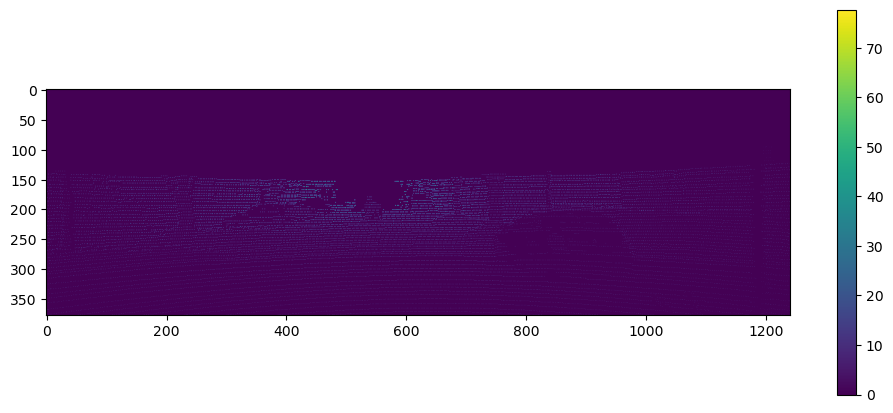

In [14]:
# Create depth image
lidar_depth_image, _ = create_depth_image(image_points, depths, w, h)
print("lidar_depth_image: ",lidar_depth_image.shape)
fig = plt.figure(figsize=(12,5))
plt.imshow(lidar_depth_image)
plt.colorbar()
plt.show()

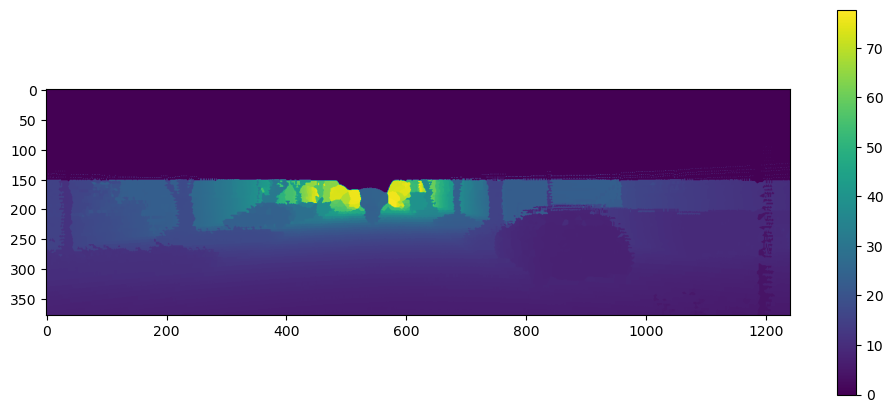

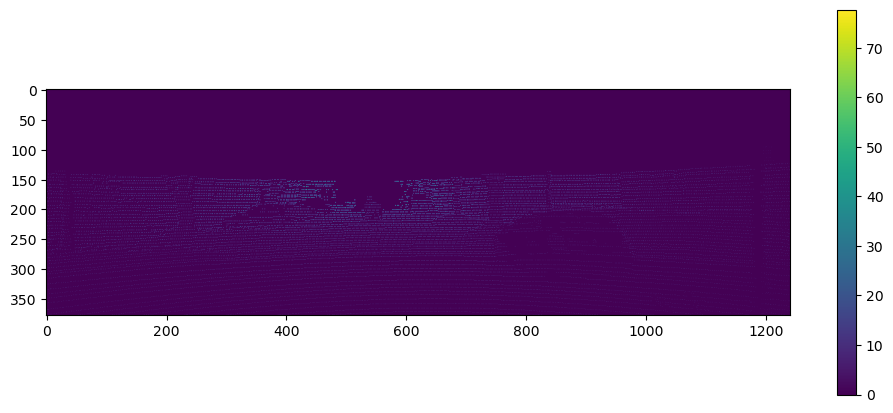

In [31]:
from scipy.interpolate import griddata

def densify_depth_image_fast(depth_image, method='nearest'):
    """
    Densify a sparse depth image using fast interpolation.

    :param depth_image: Sparse depth image
    :param method: Interpolation method ('nearest', 'linear', 'cubic')
    :return: Densified depth image
    """
    # Get the image dimensions
    height, width = depth_image.shape

    # Create a meshgrid of pixel coordinates
    x, y = np.meshgrid(np.arange(width), np.arange(height))
    
    # Mask for valid (non-zero) depth points
    valid_mask = depth_image > 0
    valid_mask[:150,:] = True

    # Coordinates and depth values of valid points
    valid_points = np.array([x[valid_mask], y[valid_mask]]).T
    valid_depths = depth_image[valid_mask]

    # Grid coordinates for interpolation
    grid_x, grid_y = np.mgrid[0:height, 0:width]

    # Interpolate using griddata
    densified_depth = griddata(valid_points, valid_depths, (grid_y, grid_x), method=method, fill_value=0)

    return densified_depth

def densify_depth_image(depth_image, mask_threshold=1, inpaint_radius=1):
    """
    Densify a sparse depth image using interpolation.

    :param depth_image: Sparse depth image
    :param mask_threshold: Threshold to generate mask for inpainting
    :param inpaint_radius: Radius of circular neighborhood for inpainting
    :return: Densified depth image
    """
    # Create a mask where depth values are missing
    mask = np.uint8(depth_image <= mask_threshold)
    print(np.unique(mask))
    mask[:150,:] = 0
    # Inpaint the depth image using the mask
    densified_depth = cv2.inpaint(depth_image, mask, inpaint_radius, cv2.INPAINT_TELEA)

    return densified_depth

newimg = densify_depth_image_fast(lidar_depth_image)
fig = plt.figure(figsize=(12,5))
plt.imshow(newimg)
plt.colorbar()
plt.show()


In [30]:
pcd = depth_image_to_point_cloud(newimg, intrinsic_calib)
visualize_point_cloud(pcd)

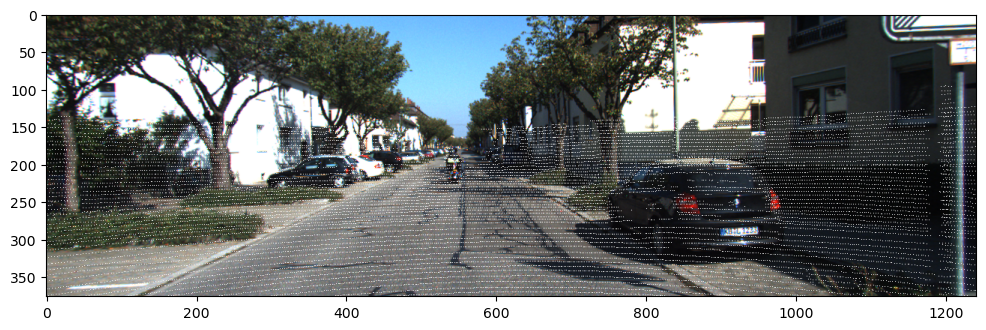

In [54]:
color_image_path = os.path.join(seq_path, "image_2/000000.png")
color_image = cv2.imread(color_image_path)

overlay_image = overlay_depth_on_color(lidar_depth_image.copy(), color_image)
overlay_image = cv2.cvtColor(overlay_image, cv2.COLOR_BGR2RGB)

fig = plt.figure(figsize=(12,5))
plt.imshow(overlay_image)
plt.show()


In [55]:
torch.set_grad_enabled(False)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Running on device "{}"'.format(device))

depth_model = PredictModel(model="HITNet_SF", ckpt="TinyHITNet/ckpt/hitnet_sf_finalpass.ckpt")
ckpt = torch.load('TinyHITNet/ckpt/hitnet_sf_finalpass.ckpt',map_location=torch.device(device))
if "state_dict" in ckpt:
    depth_model.load_state_dict(ckpt["state_dict"])
else:
    depth_model.model.load_state_dict(ckpt)
if device == 'cuda':
    _ = depth_model.cuda()


Running on device "cpu"


In [76]:
def compute_left_disparity_map(img_left, img_right, matcher='sgbm', rgb=True):
    '''
    Takes a left and right stereo pair of images and computes the disparity map for the left
    image. Pass rgb=True if the images are RGB.
    
    Arguments:
    img_left -- image from left camera
    img_right -- image from right camera
    
    Optional Arguments:
    matcher -- (str) can be 'bm' for StereoBM or 'sgbm' for StereoSGBM matching
    rgb -- (bool) set to True if passing RGB images as input
    verbose -- (bool) set to True to report matching type and time to compute
    
    Returns:
    disp_left -- disparity map for the left camera image
    
    '''
    # Feel free to read OpenCV documentation and tweak these values. These work well
    sad_window = 6
    num_disparities = sad_window*16
    block_size = 11
    matcher_name = matcher
    
    if matcher_name == 'bm':
        matcher = cv2.StereoBM_create(numDisparities=num_disparities,
                                      blockSize=block_size
                                     )
        
    elif matcher_name == 'sgbm':
        matcher = cv2.StereoSGBM_create(numDisparities=num_disparities,
                                        minDisparity=0,
                                        blockSize=block_size,
                                        P1 = 8 * 3 * sad_window ** 2,
                                        P2 = 32 * 3 * sad_window ** 2,
                                        mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY
                                       )
    if rgb:
        img_left = cv2.cvtColor(img_left, cv2.COLOR_BGR2GRAY)
        img_right = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)
    disp_left = matcher.compute(img_left, img_right).astype(np.float32)/16
    
    return disp_left

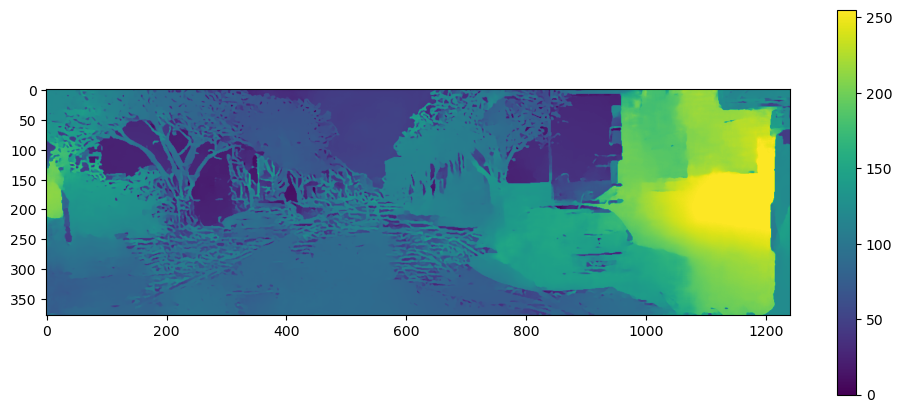

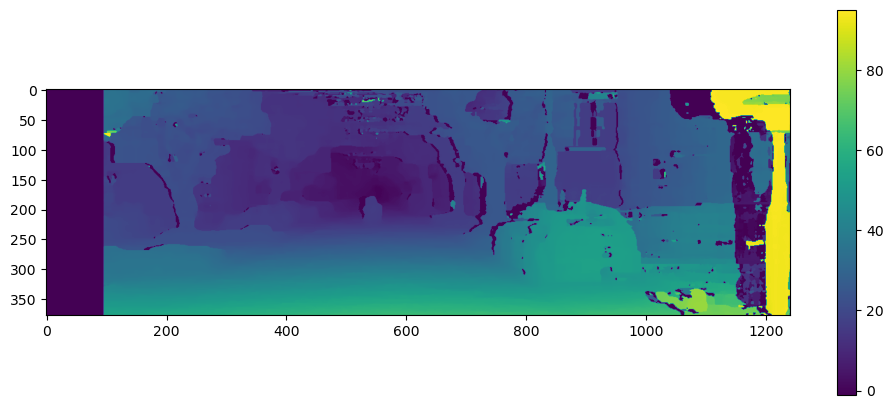

hitnet_depth:  (376, 1241)


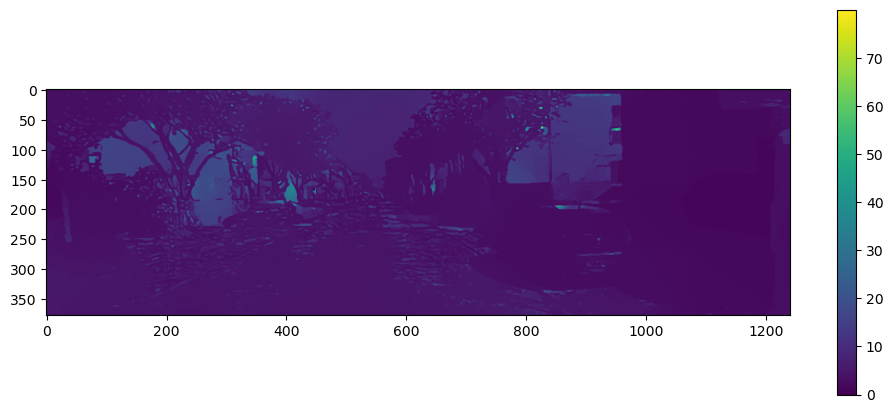

In [99]:
MAX_DEPTH = 50
right_frame = cv2.imread(f'{seq_path}/image_3/000000.png')

pred = predict(depth_model, color_image, right_frame)
disp = torch.clip(pred["disp"] / 192 * 255, 0, 255).cpu()[0,0].numpy()
# disp = pred["disp"].cpu()[0,0].numpy()
fig = plt.figure(figsize=(12,5))
plt.imshow(disp)
plt.colorbar()
plt.show()

disp2 = compute_left_disparity_map(color_image, right_frame)
fig = plt.figure(figsize=(12,5))
plt.imshow(disp2)
plt.colorbar()
plt.show()

P0, P1, P2, P3, Tr = read_calibration_file(f'{seq_path}/calib.txt')

hitnet_depth = new_disparity_to_depth(disp, P0, P1)
# hitnet_depth = disparity_to_depth(disp,fx,bl*1e-3)
hitnet_depth[hitnet_depth>80] = 0

print("hitnet_depth: ",hitnet_depth.shape)
fig = plt.figure(figsize=(12,5))
plt.imshow(hitnet_depth)
plt.colorbar()
plt.show()

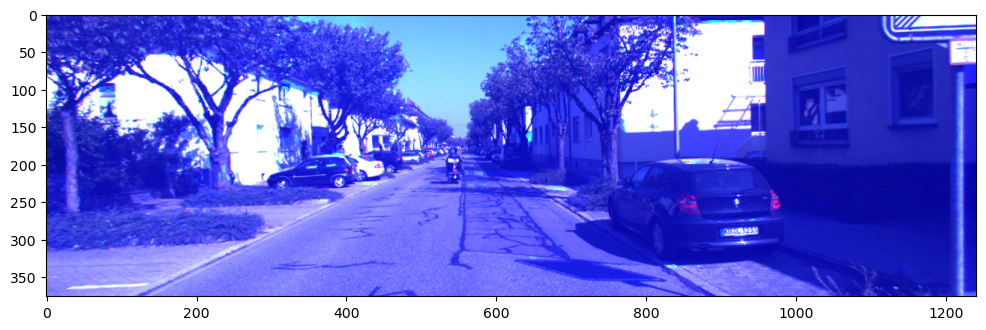

In [100]:
hitnet_display = hitnet_depth.copy()
overlay_image = overlay_depth_on_color(hitnet_display, color_image,False, 1, cv2.COLORMAP_JET)
overlay_image = cv2.cvtColor(overlay_image, cv2.COLOR_BGR2RGB)

fig = plt.figure(figsize=(12,5))
plt.imshow(overlay_image)
plt.show()

In [60]:
#apply the limit on the lidar as well
lidar_depth_image[lidar_depth_image>MAX_DEPTH] = 0

[  95 1200] 4.0829277 1.5555491253565639
[  96 1194] 4.1202946 1.514293333333333
[  96 1198] 4.1106873 1.5406578758982643
[  96 1204] 4.0993156 1.563289728522622
[  96 1208] 4.1157165 1.5596765722102728
[ 102 1195] 4.124604 1.514293333333333
[ 102 1199] 4.099019 1.5146407321541784
[ 102 1203] 4.092424 1.520477259688223
[ 102 1206] 4.0988293 1.514293333333333
[ 106 1203] 4.0906253 1.5218383794983479
[ 106 1206] 4.1050215 1.514293333333333
[ 107 1195] 4.1237907 1.514293333333333
[ 107 1199] 4.110213 1.514293333333333
[ 113 1204] 4.0681124 1.514293333333333
[ 113 1206] 4.074302 1.514293333333333
[ 114 1200] 4.0786824 1.514293333333333
[ 118 1207] 4.076589 1.514293333333333
[ 118 1211] 4.0560203 1.514293333333333
[ 119 1196] 4.1033616 1.514293333333333
[ 119 1199] 4.083775 1.514293333333333
[ 119 1203] 4.0861764 1.514293333333333
[ 123 1235] 10.216702 3.1711700366215303
[ 123 1239] 10.164128 3.17469515880165
[ 124 1205] 3.9926677 1.514293333333333
[ 124 1208] 3.9748888 1.514293333333333
[ 

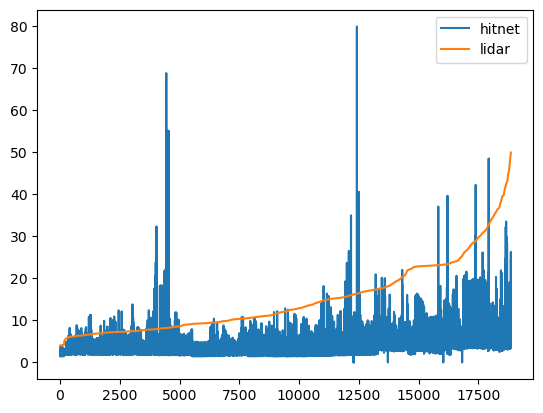

{'mean_absolute_diff': 10.786657789700076,
 'mean_squared_error': 180.84934578808554,
 'num_compared_points': 18864,
 'total error points': '18674/18864=0.9899279050042409'}

In [101]:
compare_depth_images(lidar_depth_image, hitnet_depth)

[  95 1200] 4.0829277 0.5093256997216342
[  96 1194] 4.1202946 0.5065374203436012
[  96 1198] 4.1106873 0.510261960199062
[  96 1204] 4.0993156 1.1565937764485141
[  96 1208] 4.1157165 1.1565937764485141
[ 102 1195] 4.124604 0.5093256997216342
[ 102 1199] 4.099019 0.5093256997216342
[ 102 1203] 4.092424 0.510261960199062
[ 102 1206] 4.0988293 1.1565937764485141
[ 106 1203] 4.0906253 0.5112016691497031
[ 106 1206] 4.1050215 1.1565937764485141
[ 107 1195] 4.1237907 0.5121448456610477
[ 107 1199] 4.110213 0.5121448456610477
[ 113 1204] 4.0681124 0.510261960199062
[ 113 1206] 4.074302 1.1565937764485141
[ 114 1200] 4.0786824 0.5093256997216342
[ 118 1207] 4.076589 0.510261960199062
[ 118 1211] 4.0560203 0.18322277646773386
[ 119 1196] 4.1033616 0.5083928687697649
[ 119 1199] 4.083775 0.5083928687697649
[ 119 1203] 4.0861764 0.5093256997216342
[ 123 1235] 10.216702 0.47047882431920257
[ 123 1239] 10.164128 0.4728833157552421
[ 124 1205] 3.9926677 0.5083928687697649
[ 124 1208] 3.9748888 0.5

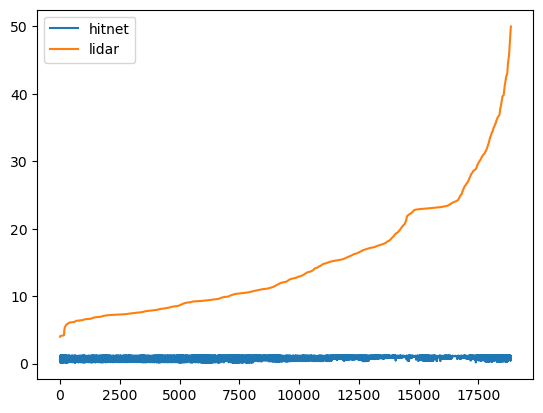

{'mean_absolute_diff': 14.308793917652926,
 'mean_squared_error': 273.86980625323986,
 'num_compared_points': 18864,
 'total error points': '18864/18864=1.0'}

In [102]:
depth_cv = compute_depth_map(color_image, right_frame,fx,bl*1e-3)
depth_cv[depth_cv>MAX_DEPTH] = 0
compare_depth_images(lidar_depth_image, depth_cv)

In [17]:
pcd = depth_image_to_point_cloud(hitnet_depth, intrinsic_calib)
visualize_point_cloud(pcd)

In [96]:
points = depth_image_to_3d_points(depth_image, intrinsic_calib)


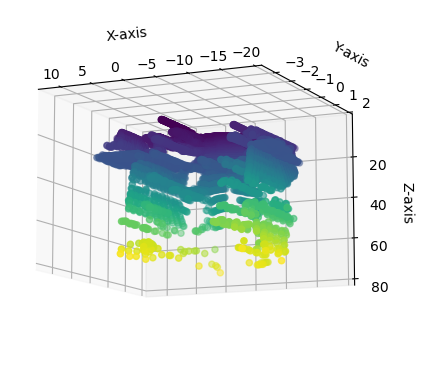

In [103]:
visualize_point_cloud_with_grid(points,170,65)

In [1]:
# If we are on colab: this clones the repo and installs the dependencies
from lightglue import LightGlue, SuperPoint, DISK
from lightglue.utils import load_image, rbd
from lightglue import viz2d
import torch

torch.set_grad_enabled(False)

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # 'mps', 'cpu'
FEAT_MAX = 4096
# extractor = SuperPoint(max_num_keypoints=FEAT_MAX).eval().to(device)  # load the extractor
extractor = SuperPoint(max_num_keypoints=FEAT_MAX).eval().to(device)  # load the extractor
matcher = LightGlue(features="superpoint").eval().to(device)

In [50]:
import cv2
import torch
import numpy as np
%matplotlib inline


from utils import *

DATASET_PATH = "/home/marknaeem97/kitti-dataset"
DATA_TRACK = '00'
MAX_IMG_HEIGHT = 256
MAX_DEPTH = 70
TRAJECTORY_PATH = 'trajectories/lidar_depth_trajectory.npy'


In [51]:
img_path = f'{DATASET_PATH}/sequences/{DATA_TRACK}/image_2/000000.png'
image0 = load_image(img_path)
img_path = f'{DATASET_PATH}/sequences/{DATA_TRACK}/image_3/000000.png'
image1 = load_image(img_path)

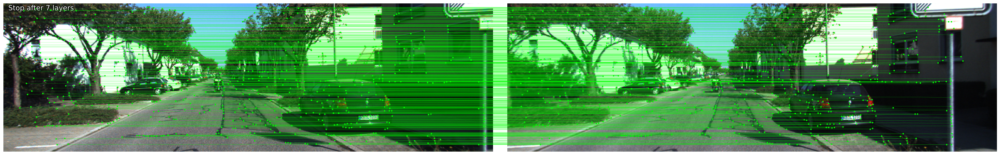

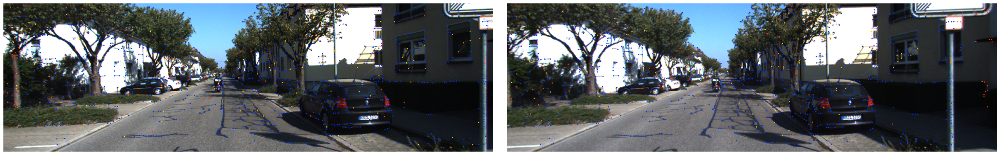

In [52]:
feats0 = extractor.extract(image0.to(device))
feats1 = extractor.extract(image1.to(device))
matches01 = matcher({"image0": feats0, "image1": feats1})

feats0, feats1, matches01 = [
    rbd(x) for x in [feats0, feats1, matches01]
]  # remove batch dimension

kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

axes = viz2d.plot_images([image0, image1])
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
viz2d.add_text(0, f'Stop after {matches01["stop"]} layers')

kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])
viz2d.plot_images([image0, image1])
viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=6)

In [45]:
axes = viz2d.plot_images([left_frame, right_frame])
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
viz2d.add_text(0, f'Stop after {matches01["stop"]} layers')

kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])
viz2d.plot_images([left_frame, right_frame])
viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=6)

